# LOAD AND DESCRIBE THE DATA

QUESTION 1:

a.)

In [92]:
import pandas as pd
import numpy as np
import seaborn as sns
import seaborn as sb
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import math
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings("ignore")

b.)

In [93]:
df = pd.read_csv('compactiv.csv')
df.head().T

,0,1,2,3,4
lread,1,0,15,0,5
lwrite,0,0,3,0,1
scall,2147,170,2162,160,330
sread,79,18,159,12,39
swrite,68,21,119,16,38
fork,0.2,0.2,2.0,0.2,0.4
exec,0.2,0.2,2.4,0.2,0.4
rchar,40671.0,448.0,NaN,NaN,NaN
wchar,53995.0,8385.0,31950.0,8670.0,12185.0
pgout,0.0,0.0,0.0,0.0,0.0


c.)

In [94]:
df.shape

(8192, 22)

In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [96]:
df.drop_duplicates(inplace=True)

In [97]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [98]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

# PERFORM EDA AND DATA CLEANING

QUESTION:2

a.)

In [99]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


b.)

In [100]:
print("df:",df.median())

df: lread             7.0
lwrite            1.0
scall          2051.5
sread           166.0
swrite          117.0
fork              0.8
exec              1.2
rchar        125473.5
wchar         46619.0
pgout             0.0
ppgout            0.0
pgfree            0.0
pgscan            0.0
atch              0.0
pgin              2.8
ppgin             3.8
pflt             63.8
vflt            120.4
freemem         579.0
freeswap    1289289.5
usr              89.0
dtype: float64


In [101]:
pd.DataFrame({'value': df['rchar'], 'Missing?': df['rchar'].isnull()})

,value,Missing?
0,40671.0,False
1,448.0,False
2,NaN,True
3,NaN,True
4,NaN,True
...,...,...
8187,405250.0,False
8188,89489.0,False
8189,325948.0,False
8190,62571.0,False


In [102]:
df['rchar'].fillna(df.rchar.median(), inplace = True)  
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


In [103]:
pd.DataFrame({'value': df['wchar'], 'Missing?': df['wchar'].isnull()})

,value,Missing?
0,53995.0,False
1,8385.0,False
2,31950.0,False
3,8670.0,False
4,12185.0,False
...,...,...
8187,85282.0,False
8188,41764.0,False
8189,52640.0,False
8190,29505.0,False


In [104]:
df['wchar'].fillna(df.wchar.median(), inplace = True)  
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


In [105]:
df.isin([0]).sum()

lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64

c.)

In [106]:
nums = []
cats = []
for i in df.columns:
    if df[i].dtype !='O':
        nums.append(i)
    else:
        cats.append(i)
print(nums)
print(cats)

['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin', 'pflt', 'vflt', 'freemem', 'freeswap', 'usr']
['runqsz']


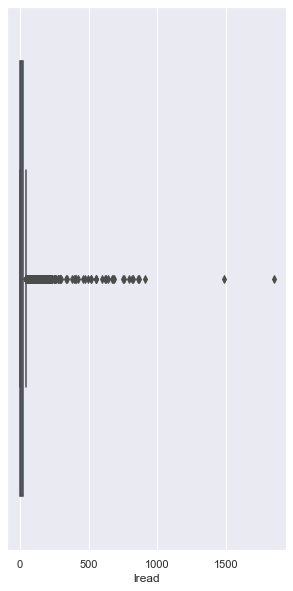

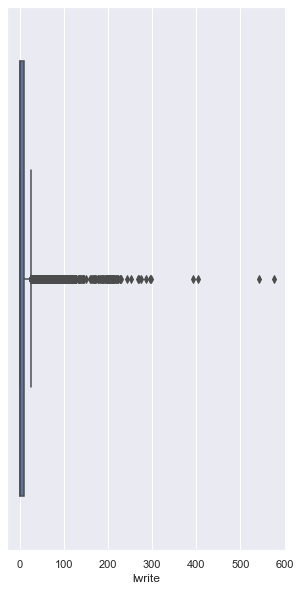

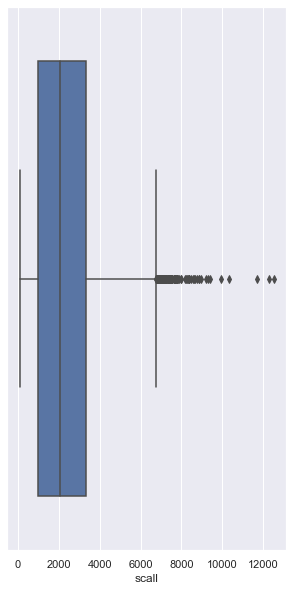

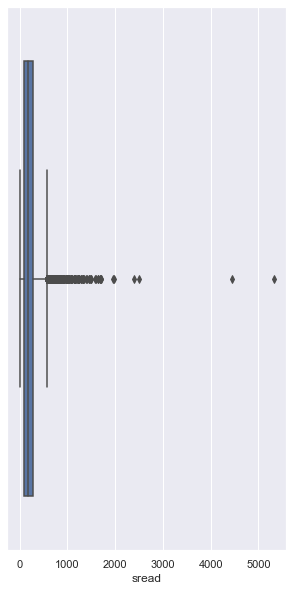

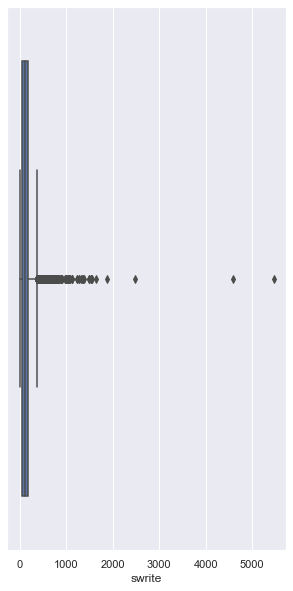

...

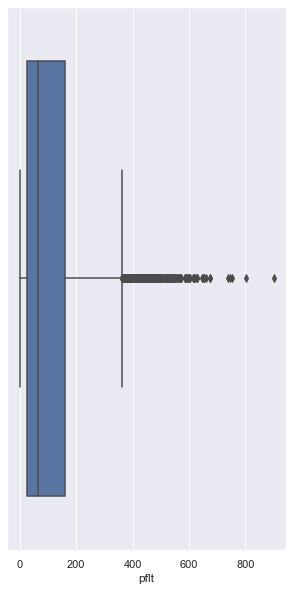

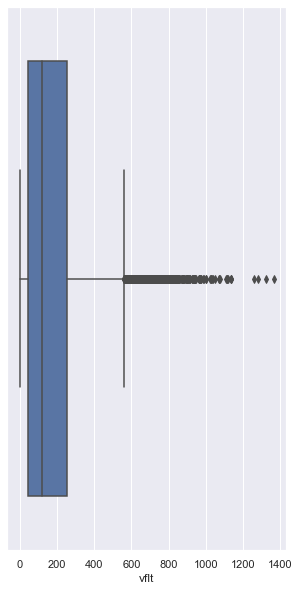

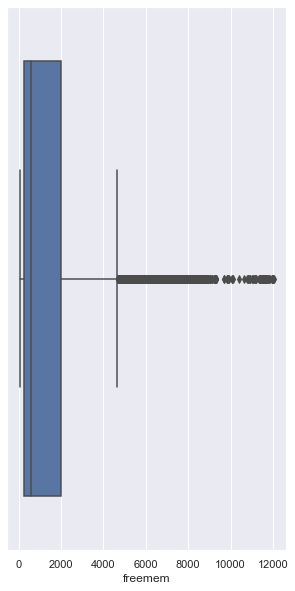

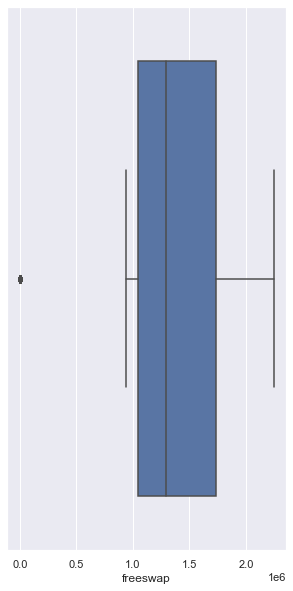

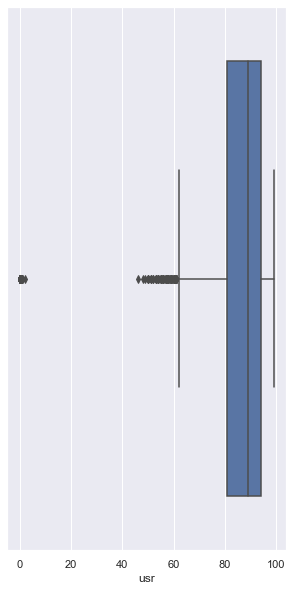

In [107]:
for x in nums:
    plt.figure(figsize=(5,10))
    sns.boxplot(df[x])
    plt.show()

In [108]:
def remove_outlier(column):
    sorted(column)
    q1=df[column].quantile(0.25)
    q3=df[column].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    upper=q3+1.5*iqr
    return lower,upper

In [109]:
for i in nums[:-1]:
    lower,upper=remove_outlier(i)
    df[i]=np.where(df[i]>upper,upper,df[i])
    df[i]=np.where(df[i]<lower,lower,df[i])

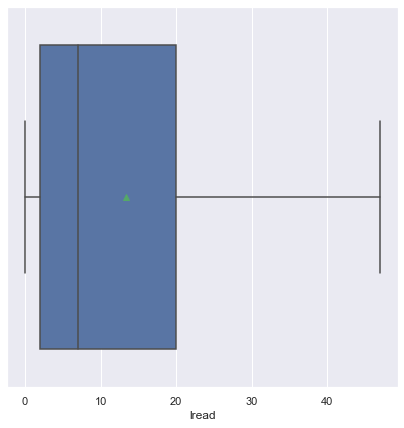

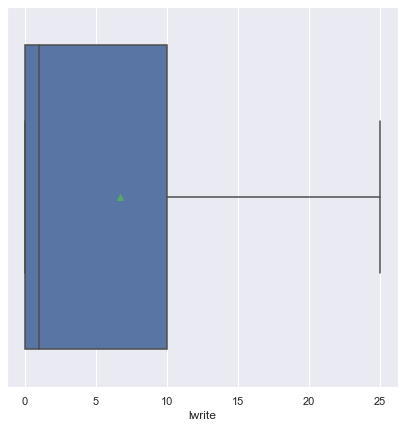

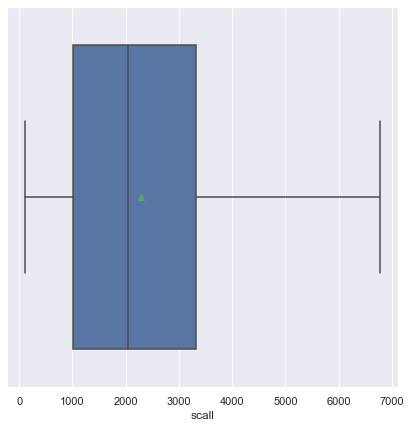

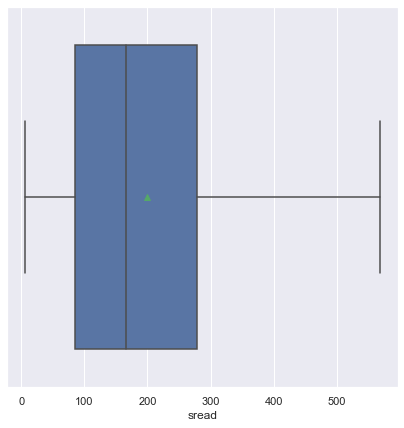

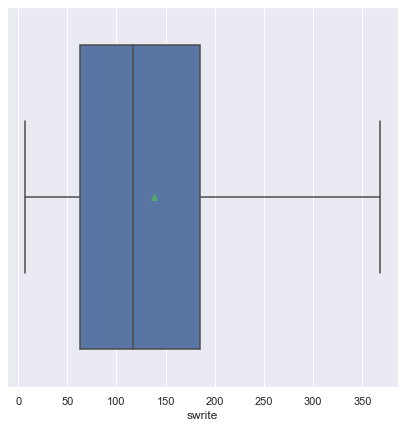

...

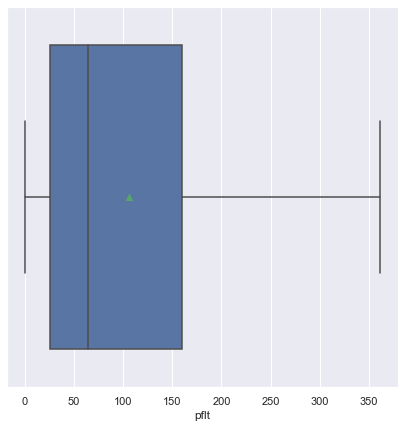

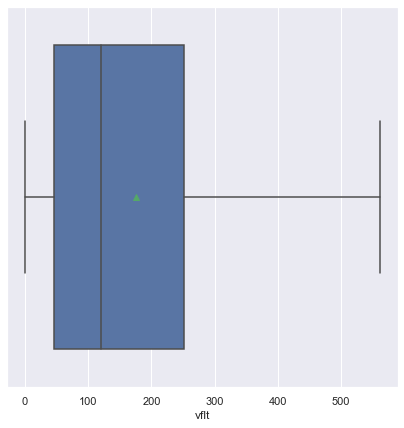

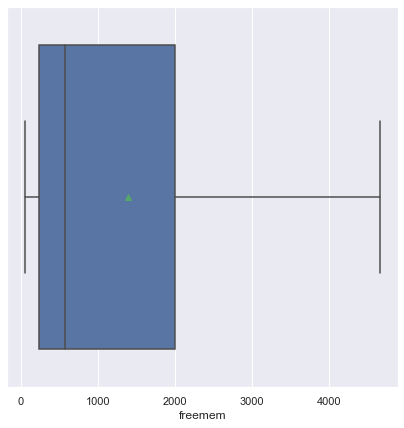

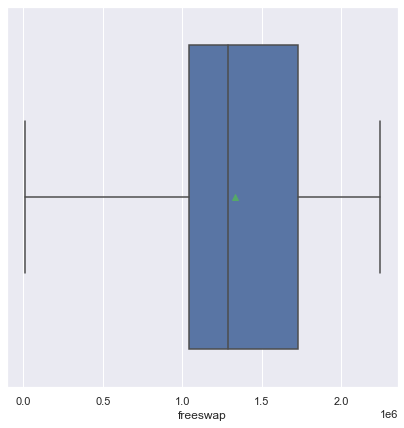

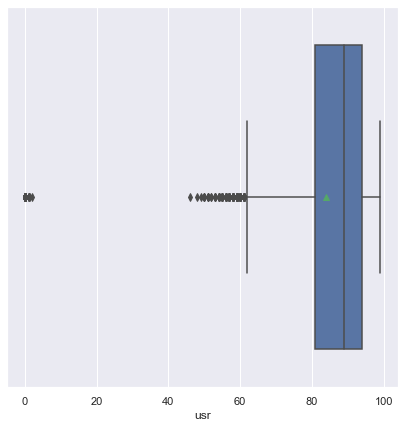

In [110]:
for i in nums:
    sns.boxplot(df[i],showmeans=True)
    plt.show()

d) Scaling & Normalization

In [111]:
scaler = MinMaxScaler()
columns=['lread','lwrite','scall','sread','swrite','fork','exec','rchar','wchar','pgout','ppgout','pgscan','pgfree','atch','pgin','ppgin','pflt','vflt','freemem','freeswap','usr']
 
df_scaled = scaler.fit_transform(df[columns].to_numpy())
df_scaled = pd.DataFrame(df_scaled,columns=columns)
print("Scaled Dataset Using MinMaxScaler")
df_scaled['runqsz']=df['runqsz']
df_scaled.head().T

Scaled Dataset Using MinMaxScaler


,0,1,2,3,4
lread,0.021277,0.0,0.319149,0.0,0.106383
lwrite,0.0,0.0,0.12,0.0,0.04
scall,0.305725,0.009151,0.307975,0.007651,0.033153
sread,0.129778,0.021333,0.272,0.010667,0.058667
swrite,0.168975,0.038781,0.310249,0.024931,0.085873
fork,0.040816,0.040816,0.408163,0.040816,0.081633
exec,0.029851,0.029851,0.358209,0.029851,0.059701
rchar,0.066119,0.000278,0.20493,0.20493,0.20493
wchar,0.229117,0.030057,0.132904,0.031301,0.046642
pgout,0.0,0.0,0.0,0.0,0.0


e.) 

In [112]:
df_scaled.runqsz.unique()

array(['CPU_Bound', 'Not_CPU_Bound'], dtype=object)

In [113]:
df= pd.get_dummies(df, prefix='CPU_Bound', columns=['runqsz'])

In [114]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,CPU_Bound_CPU_Bound,CPU_Bound_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,95,1,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,97,0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,87,0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,98,0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,90,0,1


QUESTION:3

a.)

<AxesSubplot:xlabel='lread', ylabel='Density'>

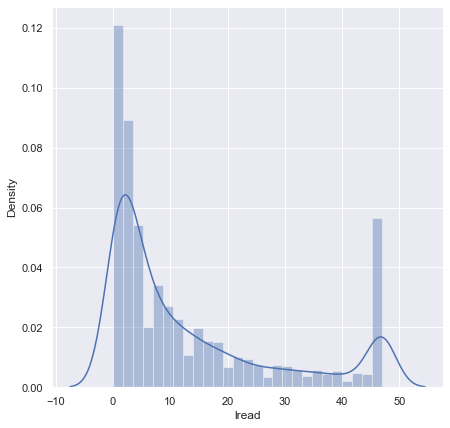

In [115]:
sns.distplot(df['lread'])

<AxesSubplot:xlabel='lwrite', ylabel='Density'>

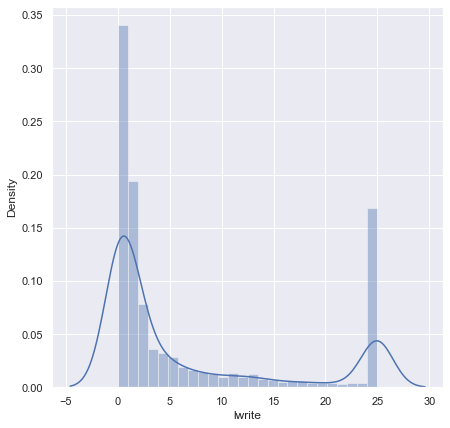

In [116]:
sns.distplot(df['lwrite'])

<AxesSubplot:xlabel='scall', ylabel='Density'>

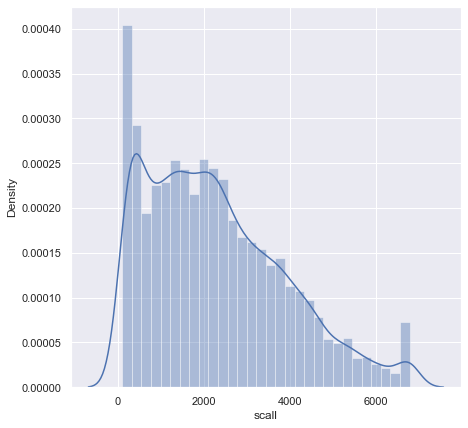

In [117]:
sns.distplot(df['scall'])

<AxesSubplot:xlabel='sread', ylabel='Density'>

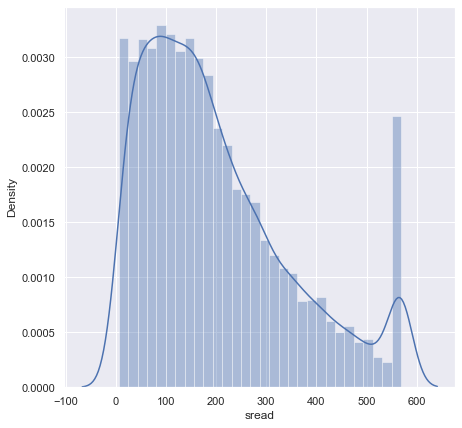

In [118]:
sns.distplot(df['sread']) 

<AxesSubplot:xlabel='swrite', ylabel='Density'>

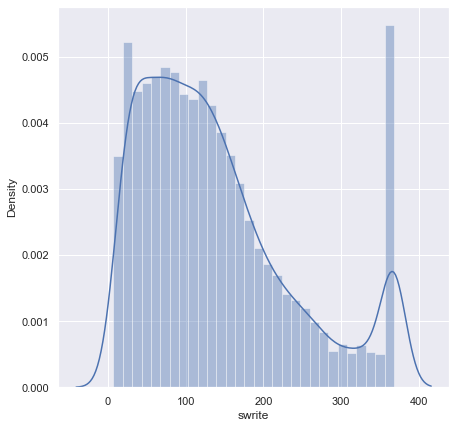

In [119]:
sns.distplot(df['swrite'])

<AxesSubplot:xlabel='fork', ylabel='Density'>

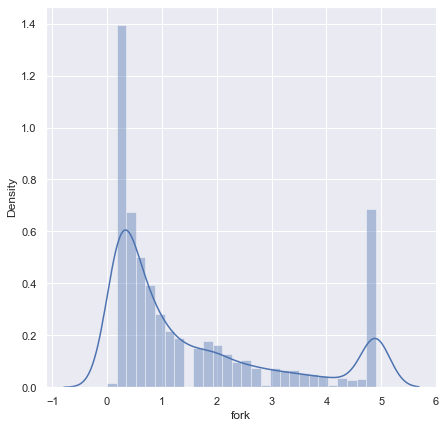

In [120]:
sns.distplot(df['fork'])

<AxesSubplot:xlabel='exec', ylabel='Density'>

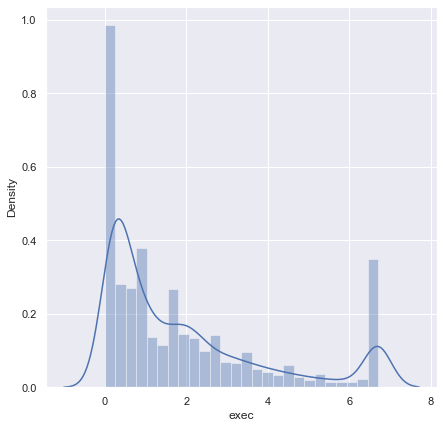

In [121]:
sns.distplot(df['exec'])

<AxesSubplot:xlabel='rchar', ylabel='Density'>

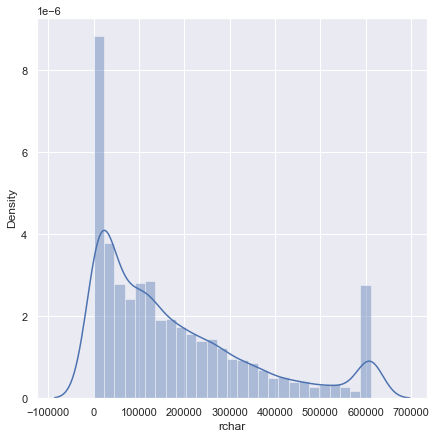

In [122]:
sns.distplot(df['rchar'])

<AxesSubplot:xlabel='wchar', ylabel='Density'>

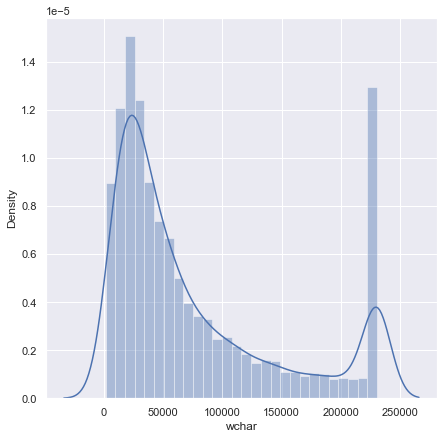

In [123]:
sns.distplot(df['wchar'])

<AxesSubplot:xlabel='pgout', ylabel='Density'>

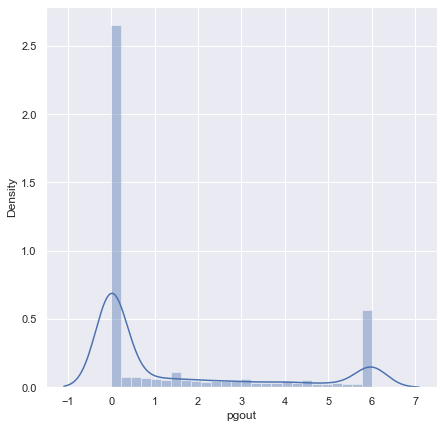

In [124]:
sns.distplot(df['pgout'])

<AxesSubplot:xlabel='ppgout', ylabel='Density'>

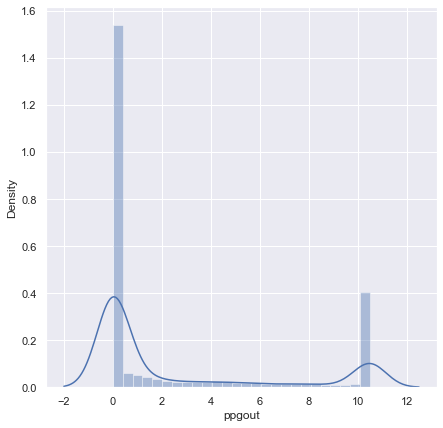

In [125]:
sns.distplot(df['ppgout'])

<AxesSubplot:xlabel='pgfree', ylabel='Density'>

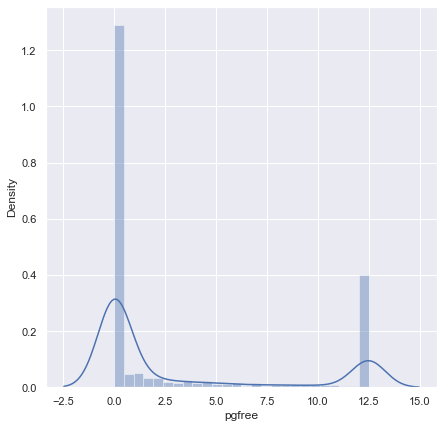

In [126]:
sns.distplot(df['pgfree'])

<AxesSubplot:xlabel='pgscan', ylabel='Density'>

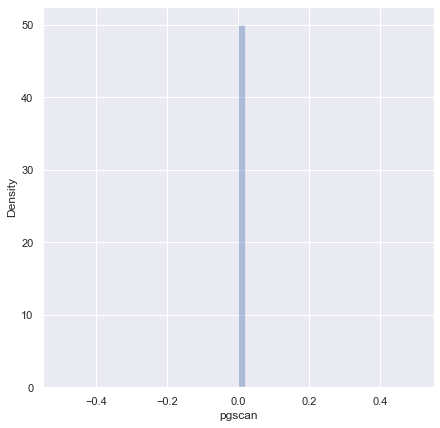

In [127]:
sns.distplot(df['pgscan'])

<AxesSubplot:xlabel='atch', ylabel='Density'>

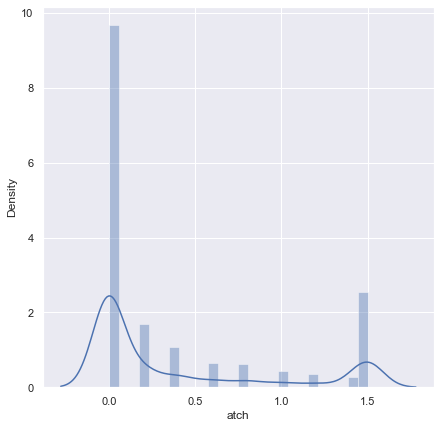

In [128]:
sns.distplot(df['atch'])

<AxesSubplot:xlabel='pgin', ylabel='Density'>

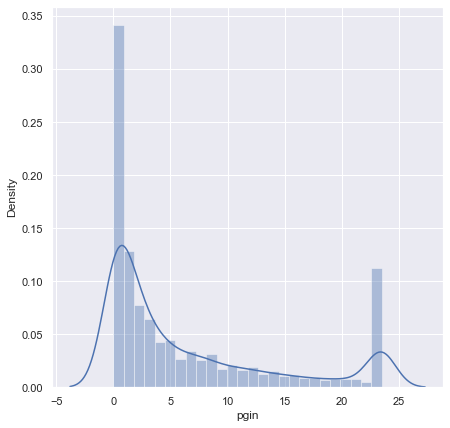

In [129]:
sns.distplot(df['pgin'])

<AxesSubplot:xlabel='ppgin', ylabel='Density'>

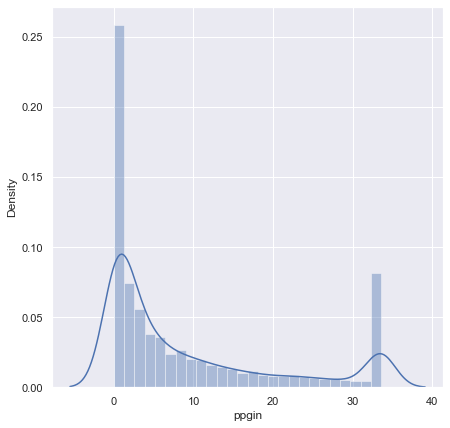

In [130]:
sns.distplot(df['ppgin'])

<AxesSubplot:xlabel='pflt', ylabel='Density'>

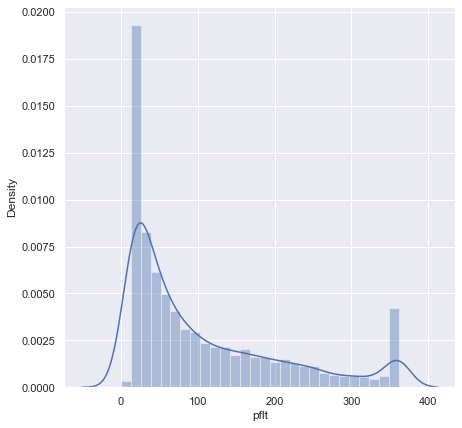

In [131]:
sns.distplot(df['pflt'])

<AxesSubplot:xlabel='freemem', ylabel='Density'>

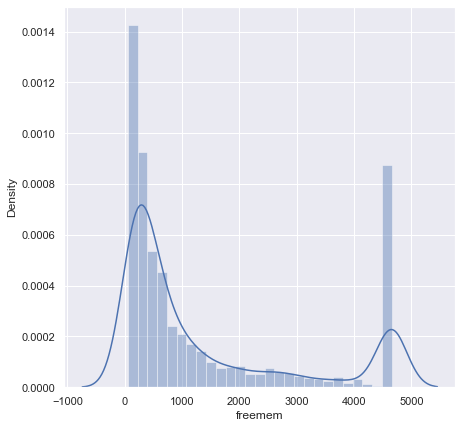

In [132]:
sns.distplot(df['freemem'])

<AxesSubplot:xlabel='freeswap', ylabel='Density'>

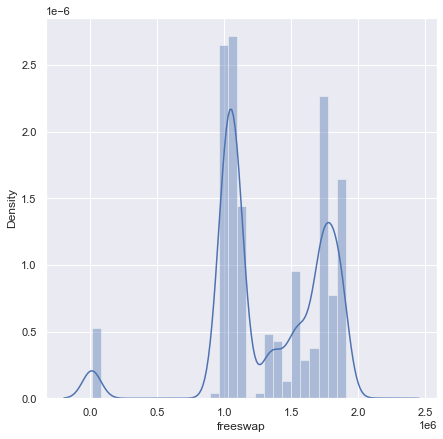

In [133]:
sns.distplot(df['freeswap'])

<AxesSubplot:xlabel='usr', ylabel='Density'>

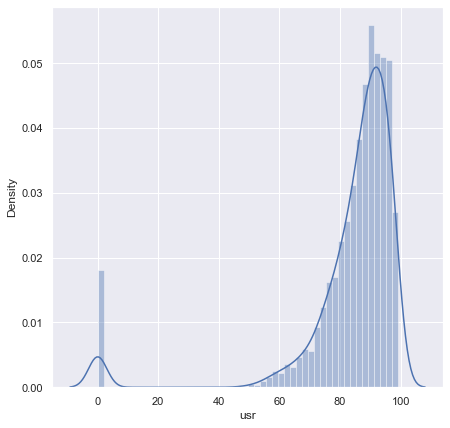

In [134]:
sns.distplot(df['usr'])

We have performed univariate analysis for each variable(in the HTML file.) For lread its is positively skewed and greater frequency. For lwrite its similar to lread but its less frequent. For all of the graphs itself we can see an unique peak in the beginning and then a drop which is constant and then a sudden rise as well. For pg scan we can see there is no data to be distributed



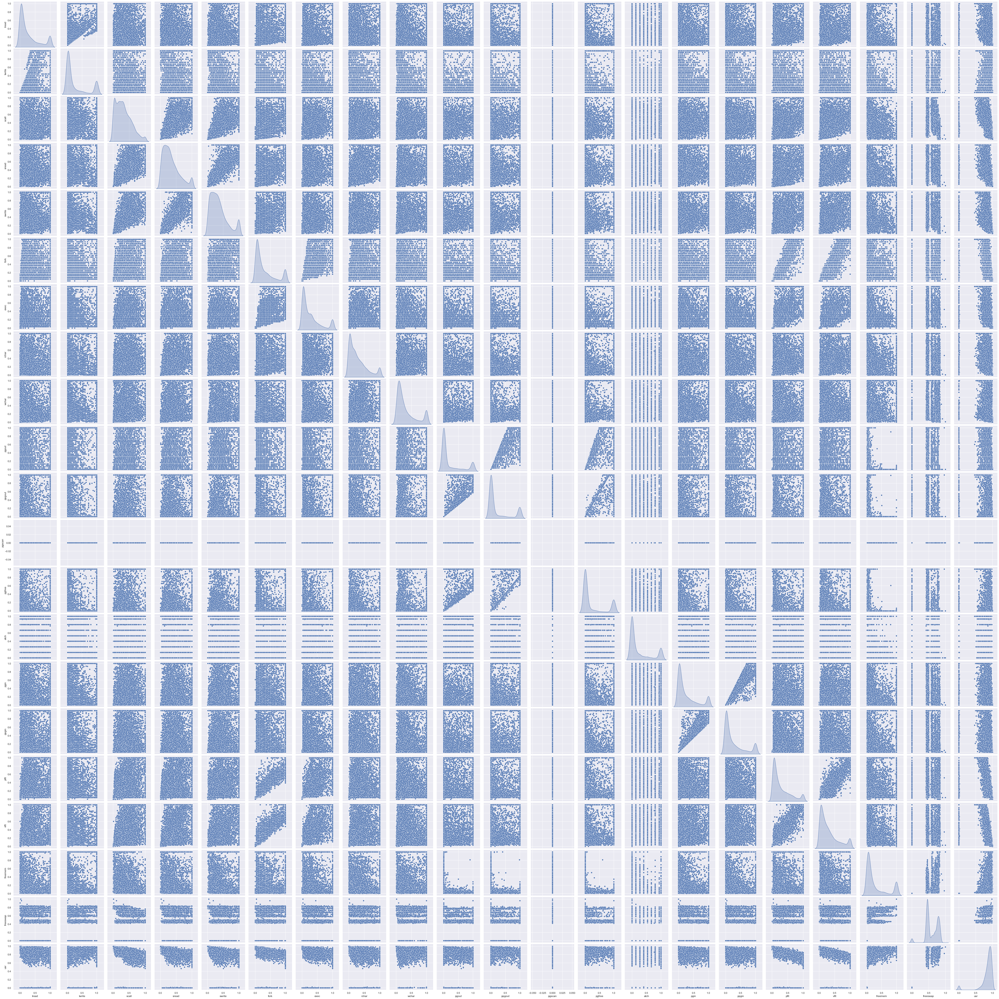

In [135]:
sns.pairplot(df_scaled, diag_kind='kde',size = 3)
plt.show()


<AxesSubplot:>

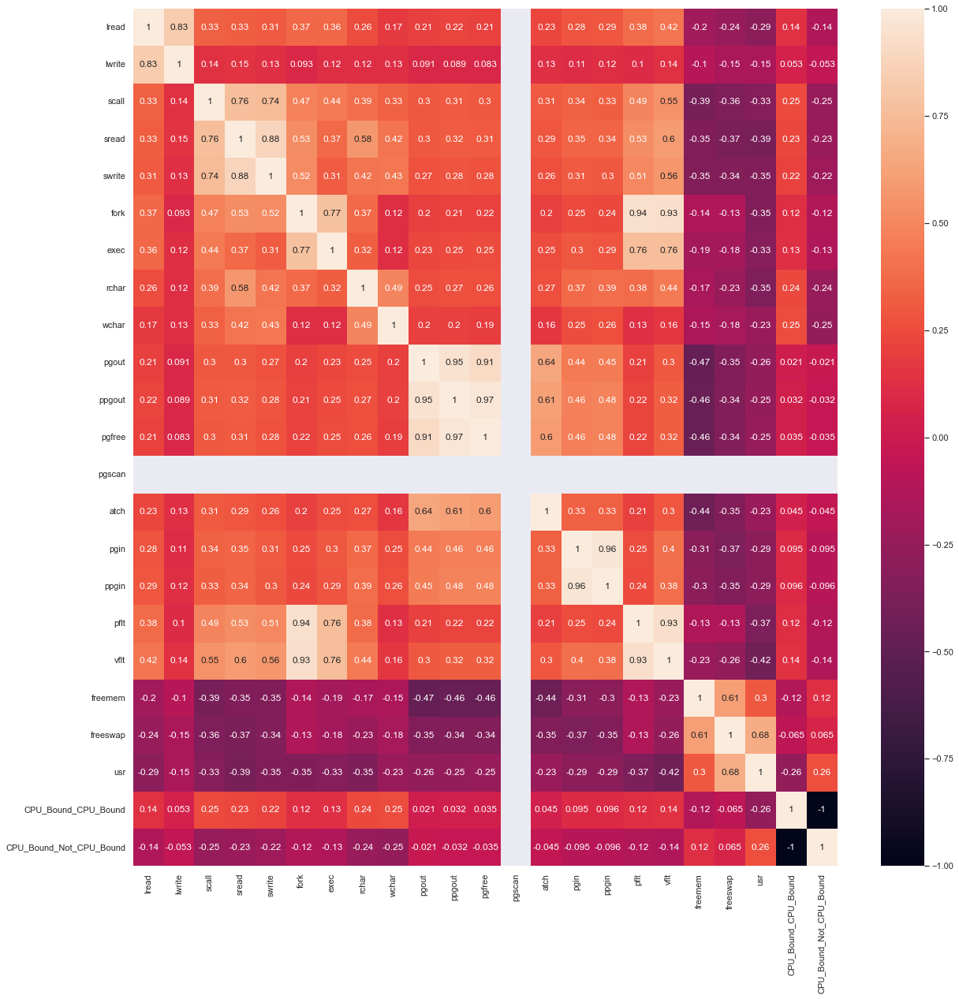

In [182]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True)



<AxesSubplot:>

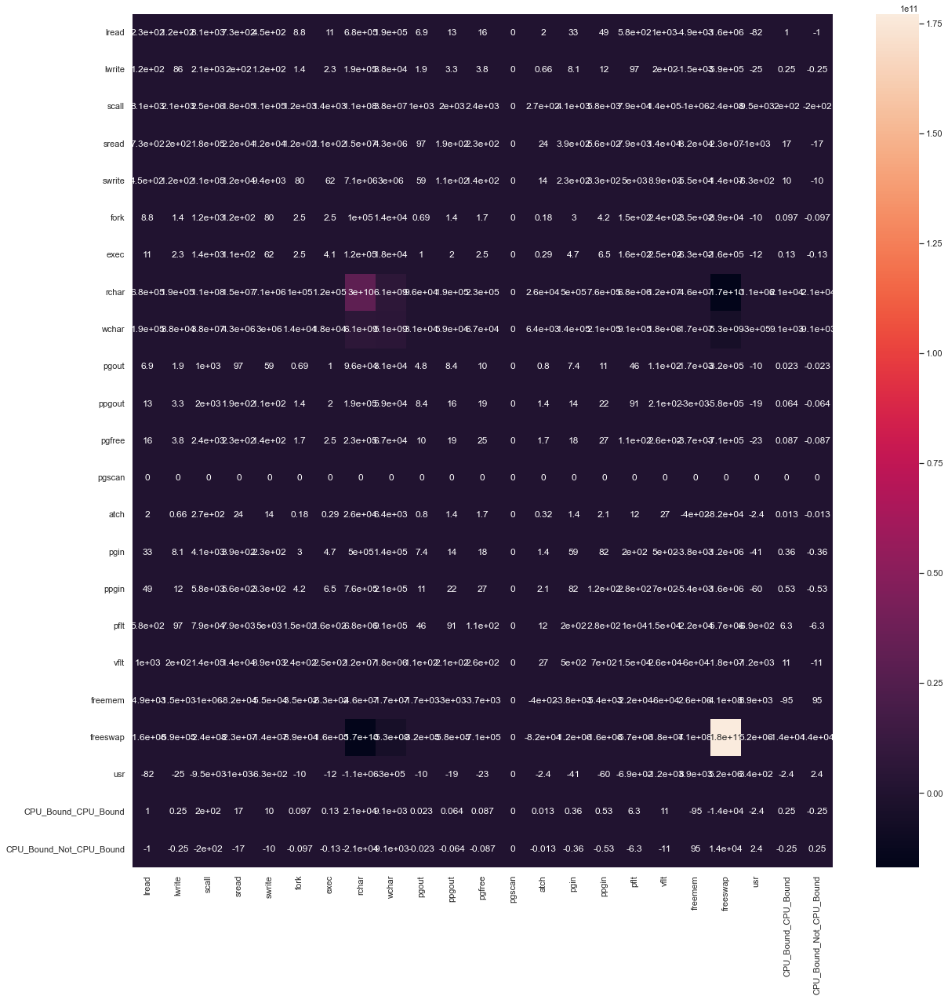

In [181]:
plt.figure(figsize=(20,20))
sns.heatmap(df.cov(), annot=True)



In [137]:
df.corr()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,CPU_Bound_CPU_Bound,CPU_Bound_Not_CPU_Bound
lread,1.000000,0.834674,0.333572,0.326032,0.306542,0.365676,0.364062,0.255544,0.174410,0.208258,...,0.230628,0.283252,0.290564,0.375250,0.421079,-0.201369,-0.243903,-0.292817,0.136419,-0.136419
lwrite,0.834674,1.000000,0.140213,0.148028,0.132097,0.093166,0.121778,0.117504,0.132595,0.090726,...,0.126769,0.113368,0.118388,0.102631,0.135243,-0.099558,-0.149630,-0.148599,0.053363,-0.053363
scall,0.333572,0.140213,1.000000,0.763001,0.742206,0.474491,0.440010,0.386875,0.331933,0.297487,...,0.306359,0.335380,0.325487,0.485361,0.548081,-0.388969,-0.357864,-0.325174,0.247893,-0.247893
sread,0.326032,0.148028,0.763001,1.000000,0.876652,0.528047,0.369723,0.576127,0.415059,0.301658,...,0.292044,0.346654,0.344586,0.529364,0.597892,-0.349887,-0.369897,-0.388342,0.228820,-0.228820
swrite,0.306542,0.132097,0.742206,0.876652,1.000000,0.519148,0.313323,0.419759,0.430126,0.274708,...,0.264283,0.307420,0.302481,0.505560,0.563163,-0.350318,-0.336869,-0.350115,0.216083,-0.216083
fork,0.365676,0.093166,0.474491,0.528047,0.519148,1.000000,0.774268,0.370995,0.122990,0.197047,...,0.201768,0.247715,0.236216,0.939125,0.932579,-0.136045,-0.133135,-0.351232,0.122392,-0.122392
exec,0.364062,0.121778,0.440010,0.369723,0.313323,0.774268,1.000000,0.324990,0.124145,0.230712,...,0.252416,0.299591,0.288017,0.758255,0.763429,-0.191919,-0.184268,-0.325499,0.125470,-0.125470
rchar,0.255544,0.117504,0.386875,0.576127,0.419759,0.370995,0.324990,1.000000,0.486317,0.250881,...,0.265281,0.369470,0.390376,0.381489,0.438870,-0.165552,-0.230327,-0.354822,0.239717,-0.239717
wchar,0.174410,0.132595,0.331933,0.415059,0.430126,0.122990,0.124145,0.486317,1.000000,0.195926,...,0.160142,0.250258,0.260535,0.125757,0.157922,-0.146838,-0.175309,-0.231823,0.254992,-0.254992
pgout,0.208258,0.090726,0.297487,0.301658,0.274708,0.197047,0.230712,0.250881,0.195926,1.000000,...,0.642940,0.437916,0.448769,0.206128,0.299740,-0.469831,-0.348040,-0.258025,0.020791,-0.020791


In [138]:
df.cov()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,CPU_Bound_CPU_Bound,CPU_Bound_Not_CPU_Bound
lread,2.298178e+02,117.575085,8.056049e+03,7.253641e+02,4.514278e+02,8.821001,11.194106,6.763548e+05,1.884203e+05,6.946479,...,1.968174,3.299712e+01,4.916244e+01,5.776797e+02,1.037292e+03,-4.901926e+03,-1.555845e+06,-8.168663e+01,1.032398,-1.032398
lwrite,1.175751e+02,86.340235,2.075570e+03,2.018620e+02,1.192355e+02,1.377515,2.295088,1.906240e+05,8.780034e+04,1.854865,...,0.663102,8.094828e+00,1.227759e+01,9.684088e+01,2.042052e+02,-1.485465e+03,-5.850364e+05,-2.540878e+01,0.247528,-0.247528
scall,8.056049e+03,2075.569565,2.537947e+06,1.783903e+05,1.148608e+05,1202.815418,1421.760240,1.076042e+08,3.768382e+07,1042.752394,...,274.746170,4.105718e+03,5.787281e+03,7.852013e+04,1.418834e+05,-9.950339e+05,-2.398928e+08,-9.532783e+03,197.144826,-197.144826
sread,7.253641e+02,201.861981,1.783903e+05,2.153818e+04,1.249793e+04,123.312458,110.053378,1.476182e+07,4.340885e+06,97.407481,...,24.127527,3.909416e+02,5.644194e+02,7.889214e+03,1.425845e+04,-8.245453e+04,-2.284248e+07,-1.048773e+03,16.764064,-16.764064
swrite,4.514278e+02,119.235470,1.148608e+05,1.249793e+04,9.436536e+03,80.246792,61.733552,7.119080e+06,2.977596e+06,58.715107,...,14.452229,2.294826e+02,3.279483e+02,4.987170e+03,8.889667e+03,-5.464495e+04,-1.376972e+07,-6.258640e+02,10.478689,-10.478689
fork,8.821001e+00,1.377515,1.202815e+03,1.233125e+02,8.024679e+01,2.531981,2.498871,1.030661e+05,1.394643e+04,0.689878,...,0.180735,3.028963e+00,4.195076e+00,1.517499e+02,2.411355e+02,-3.476124e+02,-8.914164e+04,-1.028458e+01,0.097222,-0.097222
exec,1.119411e+01,2.295088,1.421760e+03,1.100534e+02,6.173355e+01,2.498871,4.113812,1.150827e+05,1.794388e+04,1.029592,...,0.288203,4.669408e+00,6.519885e+00,1.561753e+02,2.516149e+02,-6.250611e+02,-1.572640e+05,-1.214883e+01,0.127040,-0.127040
rchar,6.763548e+05,190624.001809,1.076042e+08,1.476182e+07,7.119080e+06,103066.059847,115082.723440,3.048139e+10,6.050629e+09,96373.614414,...,26072.565937,4.956877e+05,7.606787e+05,6.763551e+06,1.245085e+07,-4.641242e+07,-1.692079e+10,-1.139964e+06,20892.770729,-20892.770729
wchar,1.884203e+05,87800.339956,3.768382e+07,4.340885e+06,2.977596e+06,13946.433429,17943.883423,6.050629e+09,5.078409e+09,30720.472730,...,6424.325284,1.370452e+05,2.072193e+05,9.100651e+05,1.828735e+06,-1.680288e+07,-5.256850e+09,-3.040070e+05,9071.330124,-9071.330124
pgout,6.946479e+00,1.854865,1.042752e+03,9.740748e+01,5.871511e+01,0.689878,1.029592,9.637361e+04,3.072047e+04,4.841105,...,0.796347,7.404139e+00,1.102036e+01,4.605586e+01,1.071674e+02,-1.659952e+03,-3.222249e+05,-1.044712e+01,0.022836,-0.022836


In [139]:
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
  
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]
cols_to_remove=list(vif_data.loc[vif_data['VIF']>=5]['feature'])
print(cols_to_remove)
  
vif_data.sort_values('VIF', ascending=False)
print(vif_data)

['freeswap']
    feature       VIF
0    lwrite  1.540820
1     scall  4.326486
2      exec  2.517951
3     rchar  3.100179
4     wchar  2.899042
5    pgscan       NaN
6      atch  1.892260
7   freemem  3.167247
8  freeswap  5.744688


In [145]:
new_df=X.drop(['lread', 'sread', 'swrite', 'fork', 'pgout', 'ppgout', 'pgfree', 'pgin', 'ppgin', 'pflt', 'vflt', 'CPU_Bound_CPU_Bound', 'CPU_Bound_Not_CPU_Bound'], axis=1)
new_df

,lwrite,scall,exec,rchar,wchar,pgscan,atch,freemem,freeswap
0,0.0,2147.0,0.20,40671.0,53995.0,0.0,0.0,4659.125,1730946.0
1,0.0,170.0,0.20,448.0,8385.0,0.0,0.0,4659.125,1869002.0
2,3.0,2162.0,2.40,125473.5,31950.0,0.0,1.2,702.000,1021237.0
3,0.0,160.0,0.20,125473.5,8670.0,0.0,0.0,4659.125,1863704.0
4,1.0,330.0,0.40,125473.5,12185.0,0.0,0.0,633.000,1760253.0
...,...,...,...,...,...,...,...,...,...
8187,12.0,3009.0,5.81,405250.0,85282.0,0.0,0.6,387.000,986647.0
8188,0.0,1596.0,1.80,89489.0,41764.0,0.0,0.8,263.000,1055742.0
8189,5.0,3116.0,0.60,325948.0,52640.0,0.0,0.4,400.000,969106.0
8190,25.0,5180.0,1.20,62571.0,29505.0,0.0,0.4,141.000,1022458.0


# Build a linear Regression Model(scaled)

4.) 

In [141]:
X = df.drop('usr', axis=1)
y = df[['usr']]

In [142]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,CPU_Bound_CPU_Bound,CPU_Bound_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,1,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,0,1


Check Multi-collinearity using VIF

In [146]:
vif = [variance_inflation_factor(X.values, ix) for ix in range(X.shape[1])] 

In [147]:
i=0
for column in X.columns:
    if i < 15:
        print (column ,"--->",  vif[i])
        i = i+1

lread ---> 5.232534882470838
lwrite ---> 4.260737491684919
scall ---> 2.9890877339622937
sread ---> 6.517014292159949
swrite ---> 5.639797517443181
fork ---> 12.947438478657318
exec ---> 3.1375249704246078
rchar ---> 2.087445737239059
wchar ---> 1.6056667145387191
pgout ---> 11.474543882811679
ppgout ---> 30.685097541787272
pgfree ---> 17.17512180642015
pgscan ---> nan
atch ---> 1.8596581052295806
pgin ---> 13.733882306297474


Linear Regression Model

In [148]:
X = new_df
y = df[['usr']]

In [150]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25 , random_state=1)

In [151]:
model.predict(X_train)

5745     68.397776
1930     53.316204
5622     60.481046
5340    102.002734
2255     98.826406
           ...    
7935     74.811305
5192     96.452824
3980     69.561082
235      70.027195
5157     94.588283
Length: 6144, dtype: float64

In [152]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [153]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lwrite is -0.058127152795354
The coefficient for scall is 4.839980419857865e-06
The coefficient for exec is -1.6805010105580211
The coefficient for rchar is -1.6342812718241054e-05
The coefficient for wchar is -1.0627935572899192e-05
The coefficient for pgscan is -9.785922072680364e-14
The coefficient for atch is 0.9660984921841413
The coefficient for freemem is -0.0021454803784539084
The coefficient for freeswap is 3.096245172144866e-05


5.)

In [154]:
# Let us check the intercept for the model
intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 52.703408616461346


In [155]:
# R square on training data
regression_model.score(X_train, y_train)

0.5513661898690928

In [156]:
#R square on testing data
regression_model.score(X_test, y_test)

0.5447312405803018

In [157]:
#RMSE on training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(mean_squared_error(y_train,predicted_train))

12.16989876561295

In [158]:
##RMSE on testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(mean_squared_error(y_test,predicted_test))

12.870554763335232

In [159]:
# concatenate X and y into a single dataframe
data_train = pd.concat([X_train, y_train], axis=1)
data_test=pd.concat([X_test,y_test],axis=1)
data_train.head()

,lwrite,scall,exec,rchar,wchar,pgscan,atch,freemem,freeswap,usr
5745,10.0,2007.0,0.60,32665.0,49643.0,0.0,0.6,329.0,989029.0,94
1930,4.0,837.0,0.80,6255.0,23670.0,0.0,0.0,3052.0,1013758.0,96
5622,2.0,2227.0,6.70,108370.0,28568.0,0.0,0.2,314.0,1108418.0,77
5340,0.0,2132.0,0.20,90813.0,28590.0,0.0,0.0,488.0,1742493.0,93
2255,0.0,3517.0,2.99,310439.0,214462.0,0.0,0.2,420.0,1547657.0,86


In [160]:
data_train.columns

Index(['lwrite', 'scall', 'exec', 'rchar', 'wchar', 'pgscan', 'atch',
       'freemem', 'freeswap', 'usr'],
      dtype='object')

In [161]:
expr= 'usr ~ lwrite+scall+exec+rchar+wchar+pgscan+atch+freemem+freeswap'

In [162]:
import statsmodels.formula.api as smf
lm1 = smf.ols(formula= expr, data = data_train).fit()
lm1.params

Intercept    5.270341e+01
lwrite      -5.812715e-02
scall        4.839980e-06
exec        -1.680501e+00
rchar       -1.634281e-05
wchar       -1.062794e-05
pgscan       2.952750e-15
atch         9.660985e-01
freemem     -2.145480e-03
freeswap     3.096245e-05
dtype: float64

In [163]:
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.551
Method:                 Least Squares   F-statistic:                     942.5
Date:                Fri, 29 Jul 2022   Prob (F-statistic):               0.00
Time:                        20:24:50   Log-Likelihood:                -24072.
No. Observations:                6144   AIC:                         4.816e+04
Df Residuals:                    6135   BIC:                         4.822e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.7034      0.740     71.224      0.0

In [164]:
# Calculate MSE
mse = np.mean((lm1.predict(data_train.drop('usr',axis=1))-data_train['usr'])**2)

In [175]:
#Root Mean Squared Error - RMSE
rmse=np.sqrt(mse)
rmse

12.169898765612954

In [166]:
np.sqrt(lm1.mse_resid)

12.17882207031835

In [174]:
100 - (rmse/y_train.mean())*100

usr    85.523778
dtype: float64

In [167]:
# Prediction on Test data
y_pred = lm1.predict(data_test)

In [168]:
y_pred = regression_model.predict(X_test)

Text(0, 0.5, 'Predicted')

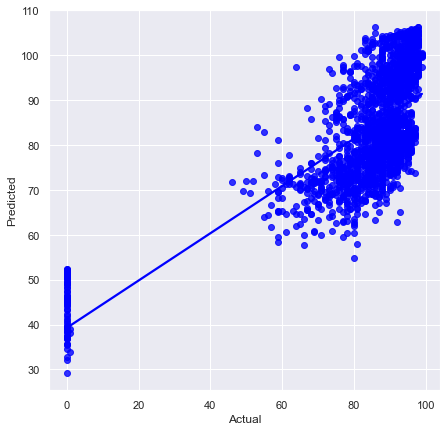

In [179]:
sns.set(rc = {'figure.figsize':(7,7)})
ax=sns.regplot(x=y_test,y=y_pred,ci=None,color ='blue');
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')

In [170]:
for i,j in np.array(lm1.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(52.7) * Intercept + (-0.06) * lwrite + (0.0) * scall + (-1.68) * exec + (-0.0) * rchar + (-0.0) * wchar + (0.0) * pgscan + (0.97) * atch + (-0.0) * freemem + (0.0) * freeswap + 